# Data Mining Homework

---

## Part 1

In [1]:
# Load 
%load_ext autoreload
%autoreload 2

## 1. The Data Importing and Preparation


In [121]:
# import Pandas dataframe from huggingface

import pandas as pd
from huggingface_hub import HfFileSystem

X = pd.read_csv("hf://datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")

In [122]:
# build up categories list

categories = ['not nostalgia', 'nostalgia']

In [123]:
# Add column mapping nostalgia = 1; not nostalgia = 0

X['category'] = X['sentiment'].map({'nostalgia':1, 'not nostalgia':0})

In [124]:
# Print out the first 5 row to observe the data.

X.head()

,sentiment,comment,category
0,not nostalgia,He was a singer with a golden voice that I lov...,0
1,nostalgia,The mist beautiful voice ever I listened to hi...,1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0
4,nostalgia,listening to his songs reminds me of my mum wh...,1


In [125]:
# Print out the full size of dataframe

X.shape

(1500, 3)

---

### **>>> Exercise 1:**  
From the above, we could find out that the dataframe is composed of three coulumn :
- The sentiment status (nostalgia / not nostalgia ) : The person leaves a comment is nostalgia or not.
- Comment : The sentence (text) each person leaves.
- Category : Dummy Variable maps the sentiment status to numeric value.

Here we would like to print out the first three comments to takes a deep looks of content in comment column.

In [6]:
for i in X.comment[:3]:
    print("\n".join(i.split("\n")))

He was a singer with a golden voice that I love to hear all the time. I was his great fan at the age of 16years in those days and still now. Although we have many singers now, but, I can vouch for Jim Reeves all the time. You feel relaxed, emotional and loving. Thank you Lord for his life.
The mist beautiful voice ever I listened to him when I was a kid and still love his singing Never forgotten The voice of an angel
I have most of Mr. Reeves songs.  Always love his smooth voice, so comforting and sounds like the people I grew up around.  They were so gentle and sweet, but I had to leave my little town to find a job at age 17.  I graduated early.  I never forgot how great it was to grow up with simple people who had no pretensions -- just loving and gentle, like I think Jesus is.


We could also try to take a glimpse of the sentiment status for the first 10 people.

In [7]:
# using iloc (by position)
X.iloc[:10, 0]

0    not nostalgia
1        nostalgia
2        nostalgia
3    not nostalgia
4        nostalgia
5        nostalgia
6        nostalgia
7        nostalgia
8    not nostalgia
9    not nostalgia
Name: sentiment, dtype: object

### **>>> Exercise 3 :**  
Further more we could try to fetch records belonging to the ```nostalgia``` category, and query every 10th record. Only show the first 5 records.

In [8]:
print(X[X['sentiment'] == 'nostalgia'].iloc[::10][0:5])

    sentiment                                            comment
1   nostalgia  The mist beautiful voice ever I listened to hi...
18  nostalgia  My Grandparents had a pub in the 1970's, this ...
32  nostalgia  I remember my Mom listening to Jim over and ov...
50  nostalgia  If I remember correctly, this song came out af...
71  nostalgia  Gosh does this bring back memories. Nearly eve...


---

## 2. Inspect the missing value and Duplicates

### 2.1 Missing Values

Missing value might effects the future prediction for the sentiment status. From the operation below, we found that there is no missing value in this tidy dataframe.

In [127]:
import helpers.data_mining_helpers as dmh

# check missing values
X.isnull()
X.isnull().apply(lambda x: dmh.check_missing_values(x))

,sentiment,comment,category
0,The amoung of missing records is:,The amoung of missing records is:,The amoung of missing records is:
1,0,0,0


---

### 2.2 Duplicate Data
Duplicate data might also effects the future prediction for the sentiment status. From the operation below, we found that there exist a duplicate value in the dataframe.

In [128]:
X.duplicated()
sum(X.duplicated())

1

We would like to take a deeper looks to the duplicate data itself and keep only one of the duplicated data.

In [15]:
X[X.duplicated()]

,sentiment,comment
78,not nostalgia,never heard this song before... WOW What an am...


In [134]:
X.drop_duplicates(keep='first', inplace=True)
X.shape

(1499, 3)

---

## 3.  Data Preprocessing

### 3.1 Sampling
Here we would like to sample the datafram to take a look form the priginal data and the sampling set.

In [135]:
X_sample = X.sample(n=500, random_state= 666) #random state

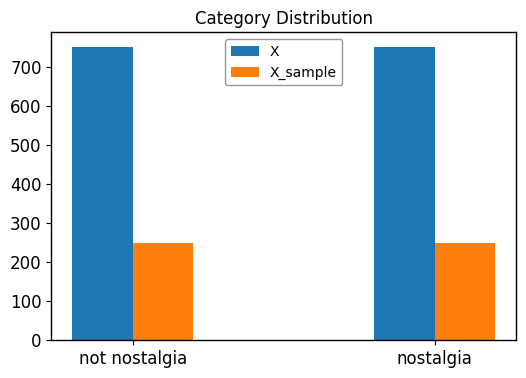

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

upper_bound = max(X.sentiment.value_counts() + 50)
listx = ['not nostalgia', 'nostalgia']

width=0.2
listx1 = [x-(width/2) for x in range(len(listx))] # 每個x都往左(width/2)
listx2 = [x+(width/2) for x in range(len(listx))] # 每個x都往右(width/2)

bar_X = X.sentiment.value_counts()
bar_X_sample = X_sample.sentiment.value_counts()

plt.figure(figsize=(6, 4))
plt.bar(listx1, bar_X, width=width, label = 'X')
plt.bar(listx2, bar_X_sample, width=width, label = 'X_sample')
plt.xticks(range(len(listx)), labels=listx, fontsize = 12)
plt.yticks(fontsize = 12)

plt.legend(loc='upper center', fontsize=10, 
           frameon=True, edgecolor = 'grey')
plt.title('Category Distribution', fontsize = 12)

ax = plt.gca()
ax.spines['right'].set_linewidth(1)
ax.spines['top'].set_linewidth(1)
ax.spines['left'].set_linewidth(1)
ax.spines['bottom'].set_linewidth(1)
plt.show()

From the barplot above, we found the data itself is quiet blance. The amounts of nostalgia or not doesn't having big different. The sampling set also present the same properties of the original dataset.

---

### 3.2 Feature Creation
In this subset, we would like to add some new features into our original dataset. 

In [143]:
import nltk
X['unigrams'] = X['comment'].apply(lambda x: dmh.tokenize_text(x))
X[0:4]

,sentiment,comment,category,unigrams
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t..."
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene..."
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw..."
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na..."


If you take a closer look at the `X` table now, you will see the new columns `unigrams` that we have added. You will notice that it contains an array of tokens, which were extracted from the original `text` field. At first glance, you will notice that the tokenizer is not doing a great job, let us take a closer at a single record and see what was the exact result of the tokenization using the `nltk` library.

---

### 3.3 Feature subset selection
Here, we are going to move away from our main dataset (one form of feature subset selection), and we are going to generate a document-term matrix from the original dataset.

In [145]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.comment) #learn the vocabulary and return document-term matrix
print(X_counts[0])

  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  (0, 2328)	2
  (0, 245)	1
  (0, 3581)	1
  (0, 1591)	1
  (0, 2082)	1
  (0, 2974)	1
  (0, 573)	1
  (0, 593)	1
  (0, 3538)	1
  (0, 1347)	2
  (0, 1833)	1
  (0, 2671)	1
  (0, 3713)	2
  (0, 1272)	1
  (0, 2688)	1
  (0, 1125)	1
  (0, 2035)	1
  (0, 3278)	1
  (0, 2018)	1
  (0, 1964)	1


---

Now let us look at the term-document matrix we built above. 

In [34]:
# We can check the shape of this matrix by:
X_counts.shape

(1499, 3730)

The 1st dimension correspond to the original 1499 commnets.       
The 2 nd dimension is the all generating unigrams in all 1499 commnets.

In [37]:
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

As you can see the result is just this huge sparse matrix, which is computationally intensive to generate and difficult to visualize. But we can see that the fifth record, specifically, contains a `1` in the beginning, which from our feature names we can deduce that this article contains exactly one `00` term.

---

Now you can also see some examples of what each feature is based on their index in the vector:

In [146]:
count_vect.get_feature_names_out()[3729]

'zulus'

### **>>> Exercise 10:**
We would like to know the coresponding words shown as '1' in the term frequency matrix.

In [147]:
# Define print word function 

def showword(array, filenum):
    words = []
    for i in range(array.shape[1]):
            if array[filenum, i] == 1 :
                temp = count_vect.get_feature_names_out()[i]
                words.append(temp)
    return words

# print the words for the slice matrix above.
showword(X_counts[0:5, 0:100].toarray(), 3)

['1st', '2nd', '30']

---

To get you started in thinking about how to better analyze your data or transformation, let us look at this nice little heat map of our term-document matrix. It may come as a surpise to see the gems you can mine when you start to look at the data from a different perspective. Visualization are good for this reason.

In [39]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names_out()[0:20]]

In [40]:
# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

In [41]:
plot_z = X_counts[0:20, 0:20].toarray() #X_counts[how many documents, how many terms]
plot_z

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0,

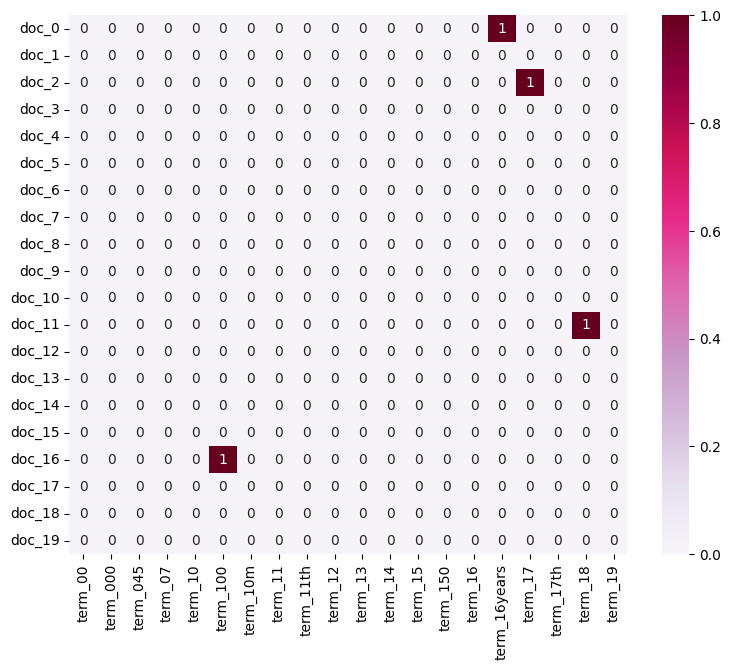

In [42]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

---

### **>>> Exercise 11 :** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with **FREQUENCY** of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

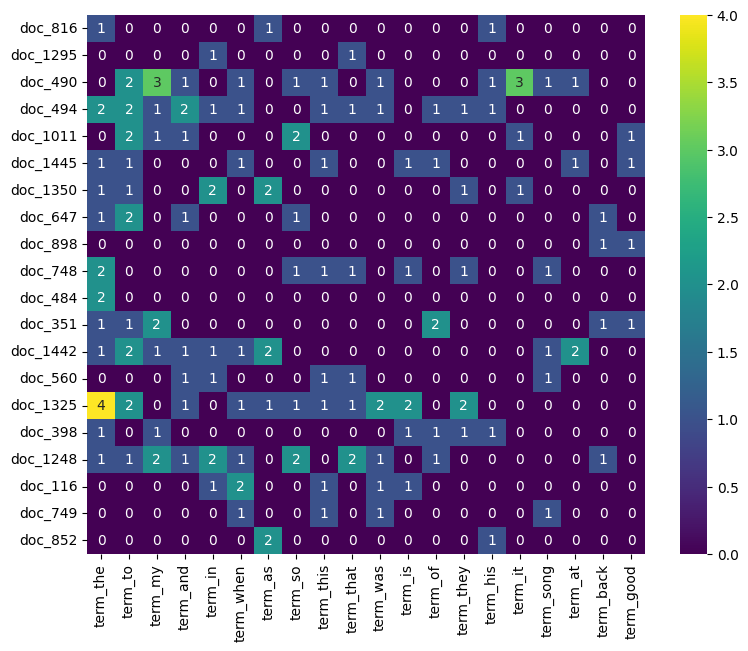

In [43]:
# Sampling 20 letters in X
X_sample = X.sample(n=20, random_state= 666)

# tokenize
X_counts_sample = count_vect.fit_transform(X_sample.comment)

#find the top 20 freqency vocab in sample
term_frequencies_samples_sort = pd.DataFrame(X_counts_sample.sum(axis=0).T, columns=['counts'])
top_20_freq = list(term_frequencies_samples_sort.nlargest(20, 'counts').index)

#plot the heatmap by new data
plot_x_samples = ["term_" + count_vect.get_feature_names_out()[i] for i in top_20_freq]
plot_y_samples = ["doc_"+ str(i) for i in list(X_sample.index)]
plot_z_samples = X_counts_sample[:, top_20_freq].toarray()

df_todraw_samples = pd.DataFrame(plot_z_samples, columns = plot_x_samples, index = plot_y_samples)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw_samples,
                 cmap="viridis",
                 vmin=0, vmax=4, annot=True)


---

### 3.4 Attribute Transformation / Aggregation
We can do other things with the term-vector matrix besides applying dimensionality reduction technique to deal with sparsity problem. Here we are going to generate a simple distribution of the words found in all the entire set of articles. Intuitively, this may not make any sense, but in data science sometimes we take some things for granted, and we just have to explore the data first before making any premature conclusions. On the topic of attribute transformation, we will take the word distribution and put the distribution in a scale that makes it easy to analyze patterns in the distrubution of words. Let us get into it!

First, we need to compute these frequencies for each term in all documents. Visually speaking, we are seeking to add values of the 2D matrix, vertically; i.e., sum of each column. You can also refer to this process as aggregation, which we won't explore further in this notebook because of the type of data we are dealing with. But I believe you get the idea of what that includes.  

In [148]:
import numpy as np
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]

/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/3480579971.py:4: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



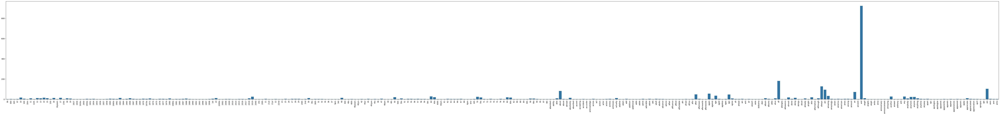

In [149]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

---

### >>> **Exercise 12 :**
Here we try to use Plotly to achieve an more interactive plot.

In [48]:
# import plotly package
import plotly.express as px

# count freqency
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
# plot the first 300 vocab in X_counts
x = count_vect.get_feature_names_out()[:300]
y = term_frequencies[:300]

# plot interact figure of data
data = {'terms': x, 'counts': y}
fig = px.bar(data, x='terms', y='counts', title='長條圖')
fig.show()

---

### >>> **Exercise 13 (take home):** 
The chart above only contains 300 vocabulary in the documents, and it's already computationally intensive to both compute and visualize. 
Here we only select the top 100 frquency terms to reduce the computational burden.


In [150]:
# select the vocab with frequency over 1 
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
plot_y_bar = pd.DataFrame(term_frequencies, columns= ['counts'])
plot_y_bar = plot_y_bar.nlargest(100, 'counts')['counts']
plot_x_bar = count_vect.get_feature_names_out()[list(plot_y_bar.index)]

# plot interact figure of data
data = {'terms': plot_x_bar, 'counts': plot_y_bar}
fig = px.bar(data, x='terms', y='counts', title='長條圖')
fig.show()


---

### >>> **Exercise 14 (take home):** 
Additionally, we can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail).

In [50]:
# select the vocab with top 300 frequency
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
plot_y_bar = pd.DataFrame(term_frequencies, columns= ['counts'])
plot_y_bar = plot_y_bar.nlargest(300, 'counts')['counts']
plot_x_bar = count_vect.get_feature_names_out()[list(plot_y_bar.index)]

# plot interact figure of data
data = {'terms': plot_x_bar, 'counts': plot_y_bar}
fig = px.bar(data, x='terms', y='counts', title='Top 300 frequency vocab')
fig.show()



---

Since we already have those term frequencies, we can also transform the values in that vector into the log distribution. The log distribution is a technique to visualize the term frequency into a scale that makes you easily visualize the distribution in a more readable format. In other words, the variations between the term frequencies are now easy to observe. Let us try it out!

/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/2426724564.py:6: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



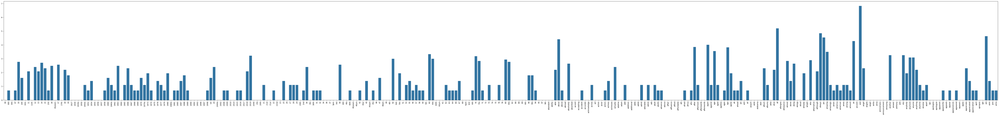

In [151]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names_out()[:300],
                y=term_frequencies_log[:300])
g.set_xticklabels(count_vect.get_feature_names_out()[:300], rotation = 90);

Besides observing a complete transformation on the disrtibution, notice the scale on the y-axis. The log distribution in our unsorted example has no meaning, but try to properly sort the terms by their frequency, and you will see an interesting effect. Go for it!

### >>> **Exercise 15 (take home):** 
You can copy the code from the previous exercise and change the 'term_frequencies' variable for the 'term_frequencies_log', comment about the differences that you observe and talk about other possible insights that we can get from a log distribution.

In [53]:
# select the vocab with top 300 frequency
term_frequencies = np.asarray(X_counts.sum(axis=0))[0]
plot_y_bar = pd.DataFrame(term_frequencies, columns= ['counts'])
plot_y_bar = plot_y_bar.nlargest(300, 'counts')['counts']
plot_x_bar = count_vect.get_feature_names_out()[list(plot_y_bar.index)]
# change the frequency to log-frequency
plot_y_bar = [math.log(i) for i in np.asarray(plot_y_bar)]


# plot interact figure of data
data = {'terms': plot_x_bar, 'counts': plot_y_bar}
fig = px.bar(data, x='terms', y='counts', title='Top 300 frequency vocab')
fig.show()

"""
*** Observation ***
Form the comparision of exercise 14 and 15, the slope of the long-right tail has been 
massively increased. The whole bar plot become less skewed in the scope of top 300 frequency vocab.
"""

'\n*** Observation ***\nForm the comparision of exercise 14 and 15, the slope of the long-right tail has been \nmassively increased. The whole bar plot become less skewed in the scope of top 300 frequency vocab.\n'

### 3.5 Finding frequent patterns

In our scenario, what we need is to mine patterns that can be representative to **each category**, in this way we will be able to differentiate each group of data more easily, for that we will need to first modify our document-term matrix to be able to work for each category, for this we will do the following:

In [54]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = X['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In the past sections we saw the behaviour of each word frequency in the documents, but we still want to generalize a little bit more so we can observe and determine the data that we are going to use to mine the patterns. For this we will group the terms in bins and we are going to plot their frequency.

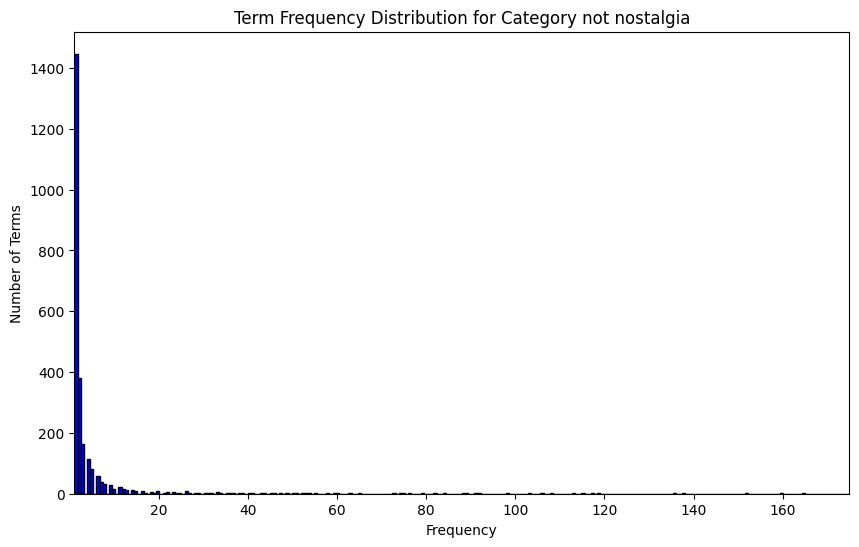

In [155]:
 # Sum over all documents to get total frequency for each word
category_number = 0 #You can change it from 0 to 3
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins = 1000, color = 'blue', edgecolor = 'black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 175)
plt.show()

From this graph, we can see that most of the words appear very infrequently across the entire dataset, while a small number of words appear quite often. When we're trying to find patterns in text data, we focus on combinations of words that are most helpful for classifying the documents. However, very rare words or extremely common words (like stopwords: 'the,' 'in,' 'a,' 'of,' etc.) don’t usually give us much useful information. To improve our results, we can filter out these words. Specifically, we'll remove the **bottom 1%** of the least frequent words and the **top 3%** of the most frequent ones. This helps us focus on words that might reveal more valuable patterns.

In [157]:
category_number = 1 #You can change it from 0 to 1

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category], top_percent=0.03)

# Example: Display the filtered DataFrame for one of the categories
#print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
#term_document_dfs[categories[category_number]]



For category not nostalgia we filter the following words:
Bottom 1.0% words: 
00               1
montgomery       1
money            1
monday           1
moments          1
mocking          1
mock             1
mitch            1
misunderstood    1
minute           1
minds            1
miller           1
monumental       1
millennium       1
miles            1
microphone       1
miami            1
meta             1
mess             1
merle            1
mendes           1
mended           1
melting          1
melt             1
melodica         1
milestone        1
dtype: int64
Top 3.0% words: 
up        40
could     41
these     41
him       41
out       43
        ... 
of       361
to       394
and      451
this     452
the      708
Length: 78, dtype: int64

For category nostalgia we filter the following words:
Bottom 1.0% words: 
yup            1
gospel         1
rose           1
round          1
rousing        1
goodness       1
routine        1
row            1
ronnie         1
r

### >>> **Exercise 16 (take home):** 
Review the words that were filtered in each category and comment about the differences and similarities that we can see.

In [66]:
"""
*** Similarities ***
The top 3% words contains a lot of same vocab frequently used in English content.
For examples, the beverb , preposition, and the subject words.
Also, I still found that in some certain words likes 'voice'.
It is in the filtered list of top 3 % words, which may not helps to classified the sentiment status.
"""

"\n*** differences ***\nThe bottom 1% words contains more rare words using related to the categories.\ncomp.graphics : contains the words related to coding like 'init_world'\nsoc.religion.christian : contains words related to social science like 'feminist'\nsci.med : contains words related to medicine and clinical trial like 'ineligible'\nalt.atheism : contains words related to atheism like 'zyklon '\n\n*** Similarities ***\nThe top 5% words contains a lot of same vocab frequently used in English content.\nFor examples, the beverb , preposition, and the subject words.\nHowever, I still found that in some certain topic likes 'sci.med'. The words like 'genetic' and 'toxic' \nis in the filtered list of top 5 % words, which may helps to classified the sci.med topics.\n"

Great! Now that our document-term frequency dataframe is ready, we can proceed with the frequent pattern mining process. To do this, we first need to convert our dataframe into a transactional database that the PAMI library can work with. We will generate a CSV file for each category to create this database.

In [158]:
from PAMI.extras.DF2DB import DenseFormatDF as db

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj = db.DenseFormatDF(term_document_dfs[category])
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 744
Number of items : 2205
Minimum Transaction Size : 1
Average Transaction Size : 10.80510752688172
Maximum Transaction Size : 47
Standard Deviation Transaction Size : 8.58455262699474
Variance in Transaction Sizes : 73.79372892516534
Sparsity : 0.9950997244776046


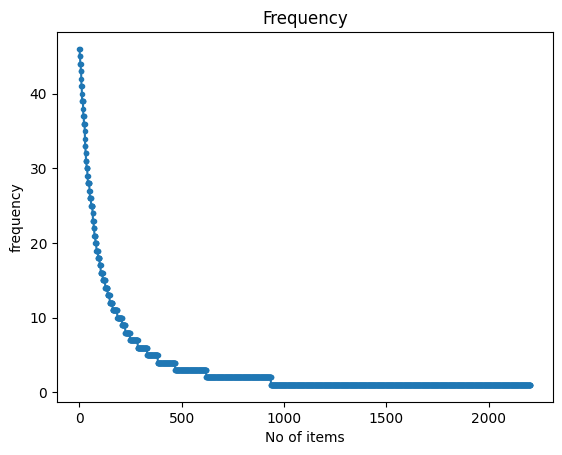

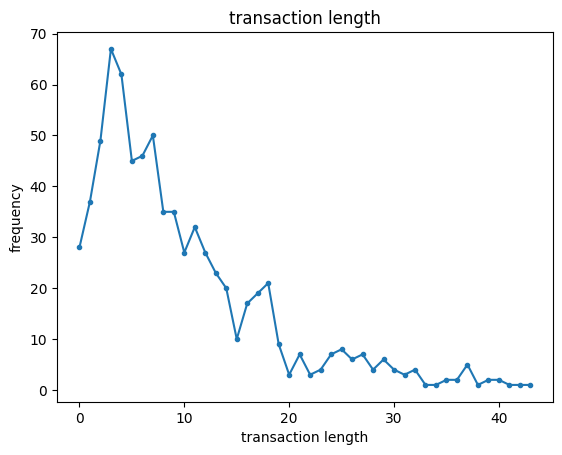

In [159]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs() 

Database size (total no of transactions) : 748
Number of items : 2498
Minimum Transaction Size : 1
Average Transaction Size : 10.378342245989305
Maximum Transaction Size : 50
Standard Deviation Transaction Size : 6.755462153665406
Variance in Transaction Sizes : 45.69736163906965
Sparsity : 0.9958453393731027


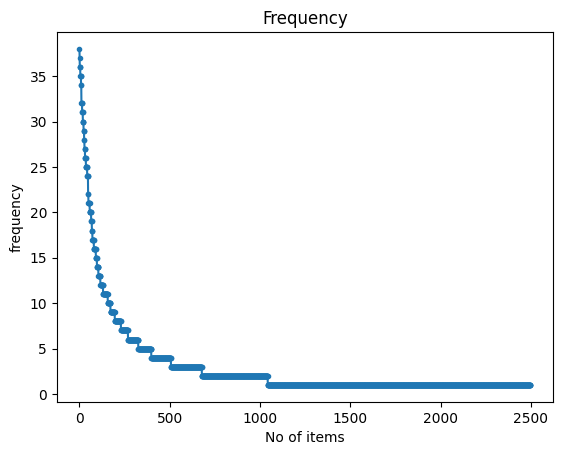

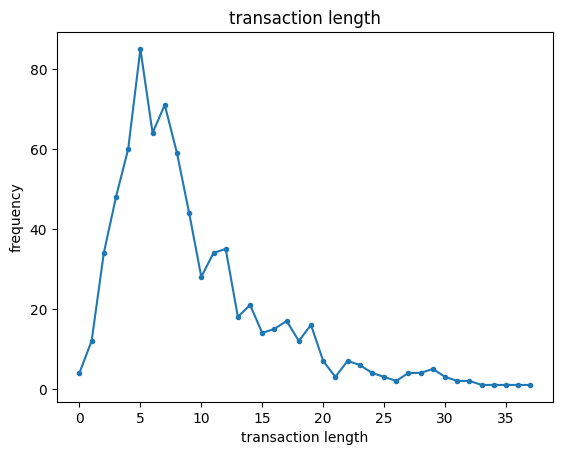

In [160]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs() 

For FPGrowth algorithm from PAMI,  we need to determine the *minimum support* (frequency) that our algorithm will use to mine for patterns in our transactions throuout the statistic above. We want to capture important patterns that show real connections in the data, but we also want to avoid too many unimportant patterns. For this dataset, we've chosen a minSup of 5. 

In [162]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=5
obj1 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime
obj1.save('frequentPatternsDF_nostalgia.txt') #save the patterns

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 628
Runtime: 0.016648054122924805


In [163]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=5
obj2 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj2.mine()
frequentPatternsDF_not_nostalgia= obj2.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj2.getRuntime())) #measure the runtime
obj2.save('frequentPatternsDF_not_nostalgia.txt') #save the patterns

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 449
Runtime: 0.01915431022644043


Now that we've extracted the transactional patterns from our databases, the next step is to integrate them effectively with our initial data for further analysis. One effective method is to identify and use only the unique patterns that are specific to each category. This involves filtering out any patterns that are common across multiple categories.

The reason for focusing on **unique patterns** is that they can **significantly improve the classification process**. When a document contains these distinctive patterns, it provides clear, category-specific signals that help our model more accurately determine the document's category. This approach ensures that the patterns we use enhance the model's ability to distinguish between different types of content.

In [164]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_nostalgia, frequentPatternsDF_not_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df in dfs:
    for pattern in df['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df) for df in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df in dfs:
    filtered_df = df[df['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

        Patterns  Support
397        never       46
399           be       46
392          can       44
381        these       42
377         what       41
..           ...      ...
294      our are        5
292    after out        5
291  after again        5
290  after never        5
310    there not        5

[621 rows x 2 columns]
Number of patterns discarded: 456


We observed a significant number of patterns that were common across different categories, which is why we chose to discard them. The next step is to integrate these now category-specific patterns into our data. How will we do this? By converting the patterns into binary data within the columns of our document-term matrix. Specifically, we will check each document for the presence of each pattern. If a pattern is found in the document, we'll mark it with a '1'; if it's not present, we'll mark it with a '0'. This binary encoding allows us to effectively augment our data, enhancing its utility for subsequent classification tasks.

In [165]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
X_tdm = count_vect.fit_transform(X['comment'])  # X['text'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
X['tokenized_text'] = X['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=X.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = X['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(X_tdm.toarray(), columns=terms, index=X.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,our times,our him,our happy,our never,our play,our are,after out,after again,after never,there not
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### >>> **Exercise 17 (take home):** 
Implement the FAE Top-K and MaxFPGrowth algorithms from the PAMI library to analyze the 'comp.graphics' category in our processed database. For the FAE Top-K, run trials with k values of 500, 1000, and 1500, recording the runtime for each. For MaxFPGrowth, test minimum support thresholds of 3, 6, and 9, noting the runtime for these settings as well.

In [169]:
from PAMI.frequentPattern.topk import FAE as alg

K_list = [250, 500, 750]  # Top 10 patterns
pattern_fae = []
runtime_fae = []

for k in K_list:
    obj_fae = alg.FAE(iFile='td_freq_db_nostalgia.csv', k = k)
    obj_fae.mine()
    frequentPatternsDF_fae = obj_fae.getPatternsAsDataFrame()
    #print(frequentPatternsDF_fae)
    pattern_fae.append(frequentPatternsDF_fae)
    print(f"Total No of patterns: {len(frequentPatternsDF_fae)}")
    print(f"Runtime: {obj_fae.getRuntime()}")
    runtime_fae.append(obj_fae.getRuntime())

 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 250
Runtime: 0.02697014808654785
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 500
Runtime: 0.06853294372558594
 TopK frequent patterns were successfully generated using FAE algorithm.
Total No of patterns: 750
Runtime: 0.21822810173034668


[0.02697014808654785, 0.06853294372558594, 0.21822810173034668]


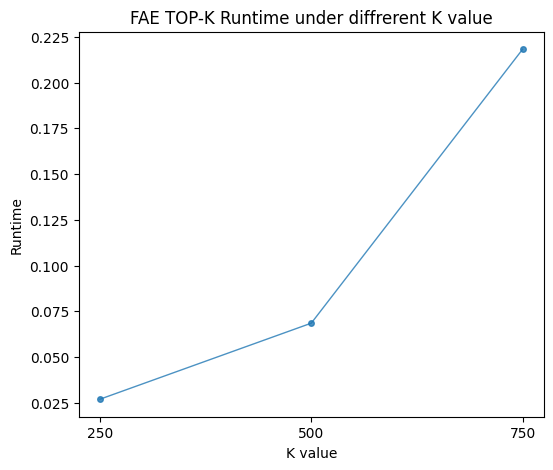

In [170]:
print(runtime_fae)
plt.figure(figsize=(6, 5))
plt.plot(K_list, runtime_fae, marker = 'o', markersize = 4, linewidth = 1, alpha = 0.8)
plt.title('FAE TOP-K Runtime under diffrerent K value')
plt.xlabel('K value')
plt.ylabel('Runtime')
plt.xticks([250, 500, 750])
plt.show()

In [168]:
from PAMI.frequentPattern.maximal import MaxFPGrowth as alg

support_list = [3, 6, 9]  # Top 10 patterns
pattern_fpg = []
runtime_fpg = []

for k in support_list:

    obj_fpg = alg.MaxFPGrowth(iFile='td_freq_db_comp_graphics.csv', minSup=k)
    obj_fpg.mine()
    frequentPatternsDF_fpg = obj_fpg.getPatternsAsDataFrame()
    #print(frequentPatternsDF_fpg)
    pattern_fpg.append(frequentPatternsDF_fpg)
    print(f"Total No of patterns: {len(frequentPatternsDF_fpg)}")
    print(f"Runtime: {obj_fpg.getRuntime()}")
    runtime_fpg.append(obj_fpg.getRuntime())


Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 6872
Runtime: 8.771815299987793
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 1340
Runtime: 0.11126494407653809
Maximal Frequent patterns were generated successfully using MaxFp-Growth algorithm 
Total No of patterns: 660
Runtime: 0.045722007751464844


Runtime : [8.771815299987793, 0.11126494407653809, 0.045722007751464844]


([<matplotlib.axis.XTick at 0x165e281a0>,
 [Text(3, 0, '3'), Text(6, 0, '6'), Text(9, 0, '9')])

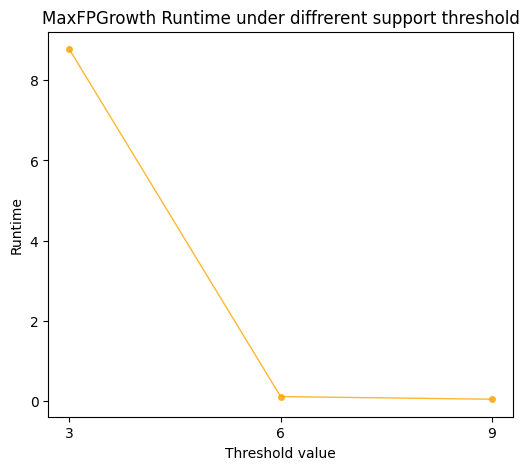

In [171]:
print(f"Runtime : {runtime_fpg}")
plt.figure(figsize=(6, 5))
plt.plot(support_list, runtime_fpg, marker = 'o', markersize = 4, linewidth = 1, alpha = 0.8, color = 'orange')
plt.title('MaxFPGrowth Runtime under diffrerent support threshold')
plt.xlabel('Threshold value')
plt.ylabel('Runtime')
plt.xticks([3, 6, 9])

---

### 3.5 Dimensionality Reduction

We will start with **Principal Component Analysis (PCA)**, which is focused on finding a projection that captures the largest amount of variation in the data. PCA is excellent for linear dimensionality reduction and works well when dealing with Gaussian distributed data. However, its effectiveness diminishes with non-linear data structures.

Additionally, we will explore two advanced techniques suited for non-linear dimensionality reductions:

- **t-Distributed Stochastic Neighbor Embedding (t-SNE)**:
        
- **Uniform Manifold Approximation and Projection (UMAP)**:
        
These methods will be applied to visualize our data more effectively, each offering unique strengths to mitigate the issue of sparsity and allowing us to observe underlying patterns in our dataset.

So, let's experiment with something interesting, from our previous work we have our data with only the document-term frequency data and also the one with both the document-term frequency and the pattern derived data, let's try to create a 2D plot after applying these algorithms to our dataframes and see what comes out.

In [81]:
#Applying dimensionality reduction with only the document-term frequency data
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
X_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
X_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
X_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

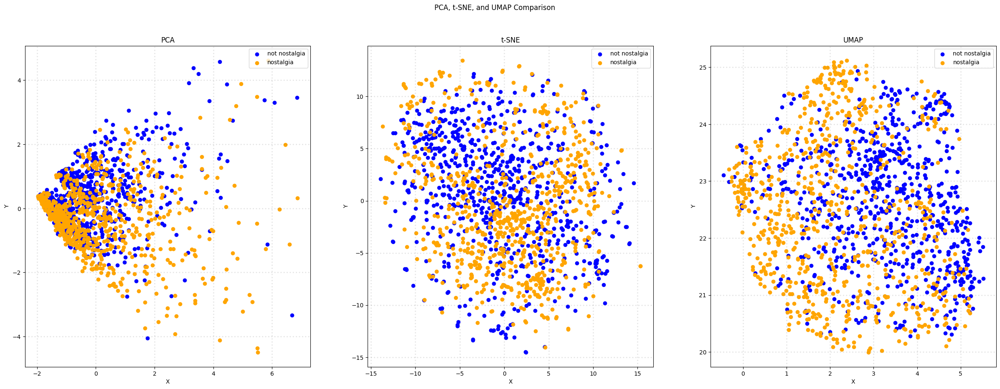

In [85]:
# Plot the results in subplots
col = ['blue',  'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_tdm, 'PCA')
plot_scatter(axes[1], X_tsne_tdm, 't-SNE')
plot_scatter(axes[2], X_umap_tdm, 'UMAP')

plt.show()

From the 2D PCA visualization above, we can see a slight "hint of separation in the data"; i.e., they might have some special grouping by category, but it is not immediately clear. In the t-SNE graph we observe a more scattered distribution, but still intermixing with all the categories. And with the UMAP graph, the limits for the data seem pretty well defined, two categories seem to have some points well differentiated from the other classes, but most of them remain intermixed. The algorithms were applied to the raw frequencies and this is considered a very naive approach as some words are not really unique to a document. Only categorizing by word frequency is considered a "bag of words" approach. Later on in the course you will learn about different approaches on how to create better features from the term-vector matrix, such as term-frequency inverse document frequency so-called TF-IDF.

Now let's try in tandem with our pattern augmented data:

In [86]:
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
X_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
X_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
X_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

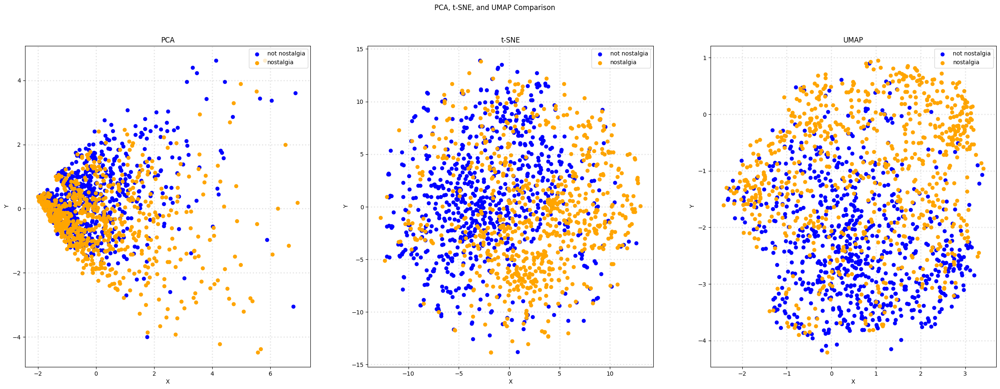

In [87]:
# Plot the results in subplots
col = ['blue', 'orange']
categories = X['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, X_reduced, title):
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], X_pca_aug, 'PCA')
plot_scatter(axes[1], X_tsne_aug, 't-SNE')
plot_scatter(axes[2], X_umap_aug, 'UMAP')

plt.show()

We can see that our PCA visualization hasn't changed much from the previous version. This is likely because the original document-term matrix still dominates what the algorithm captures, overshadowing the new binary pattern data we added.

Looking at the t-SNE graph, it might seem different at first glance. However, upon closer inspection, it's almost the same but mirrored along the y-axis, with only slight changes in how the data points are placed. This similarity might be due to the stability of the t-SNE algorithm. Even small changes in the data can result in embeddings that look different but are structurally similar, indicating that the binary patterns may not have significantly altered the relationships among the data points in high-dimensional space.

The UMAP visualization shows the most noticeable changes—it appears more compact. This compactness could be because UMAP uses a more complex distance metric, which might be making it easier to see differences between closer and further points. The binary patterns could also be helping to reduce noise within categories, resulting in clearer, more coherent groups. However, the categories still appear quite mixed together.

### >>> Exercise 18 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

In [88]:
X_pca_aug_3d = PCA(n_components=3).fit_transform(augmented_df.values)
X_tsne_aug_3d = TSNE(n_components=3).fit_transform(augmented_df.values)
X_umap_aug_3d = umap.UMAP(n_components=3).fit_transform(augmented_df.values)

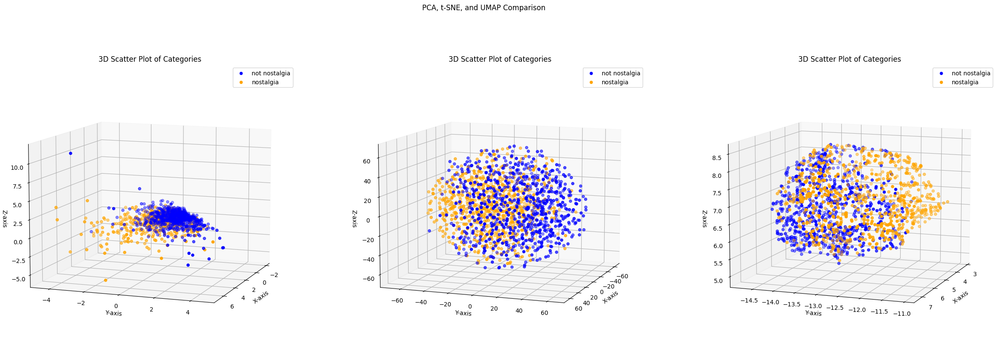

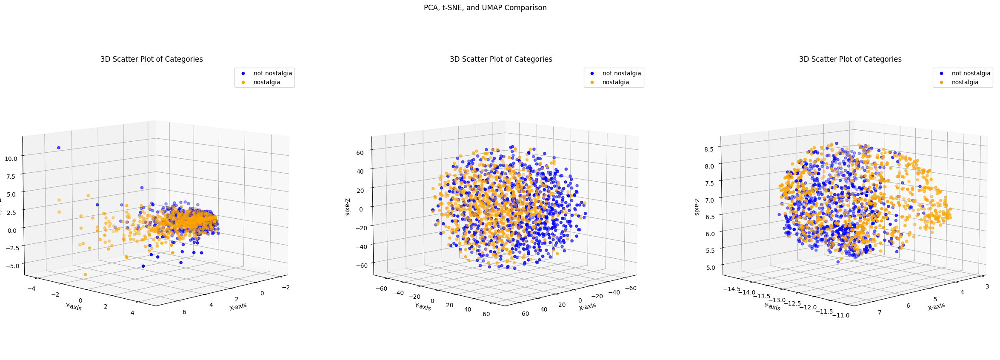

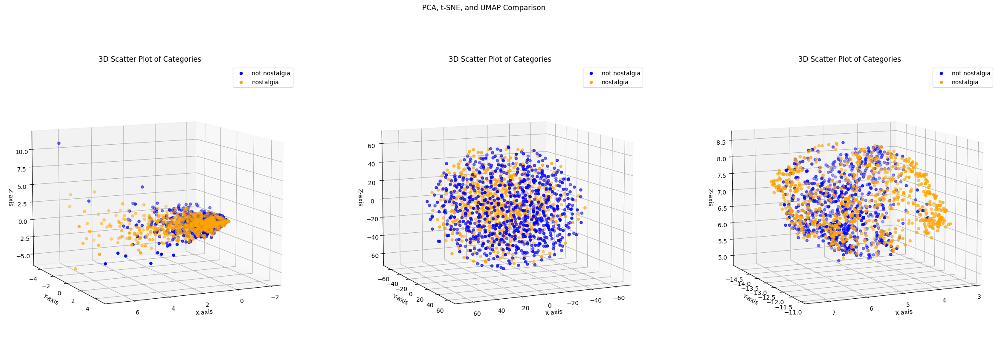

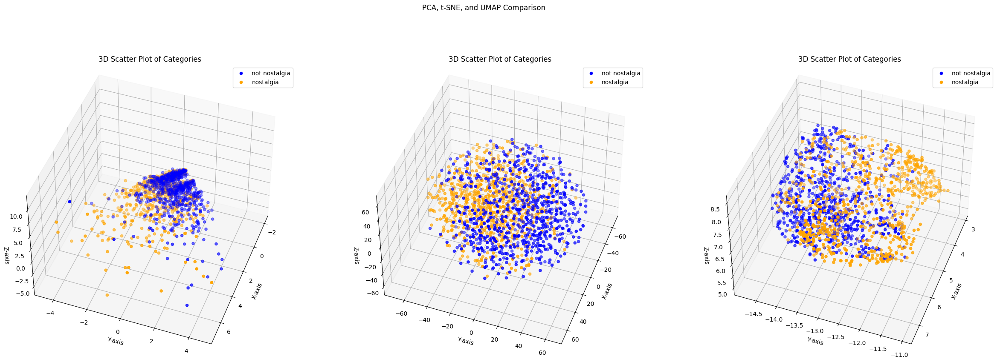

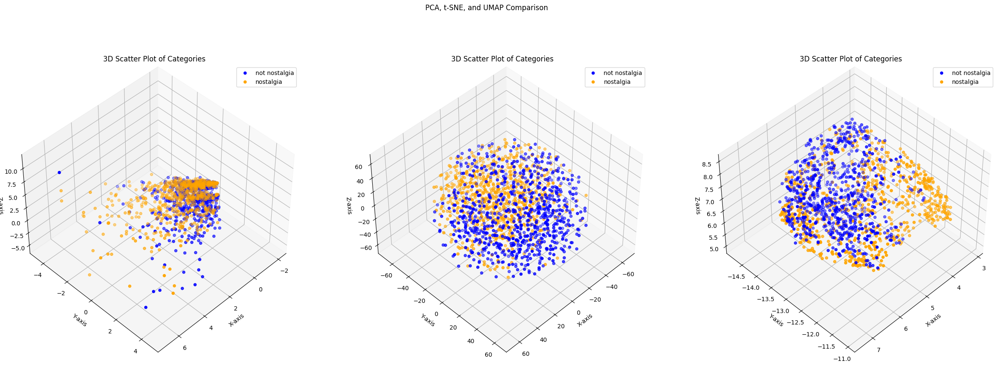

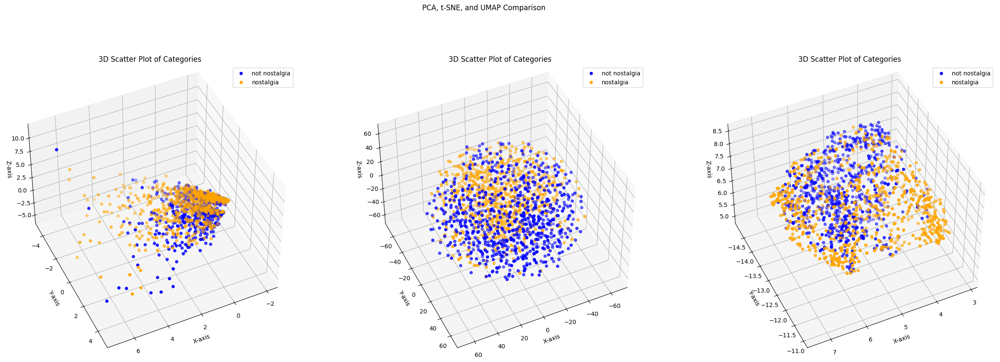

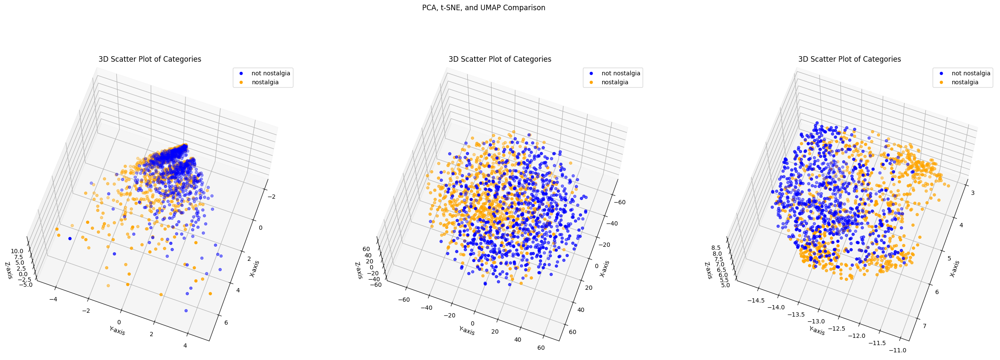

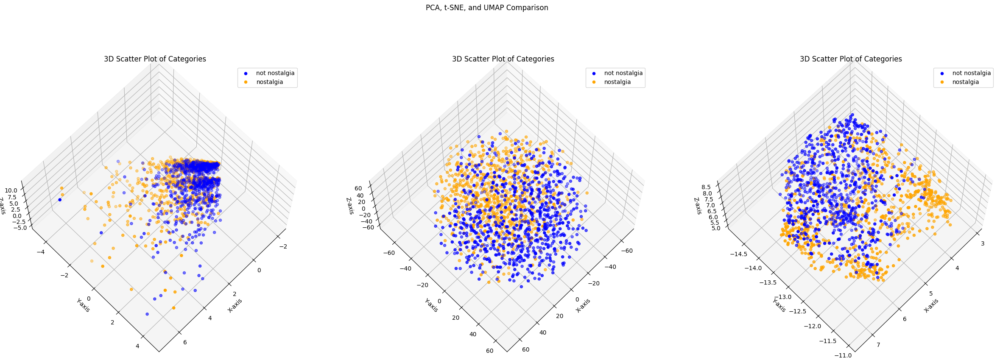

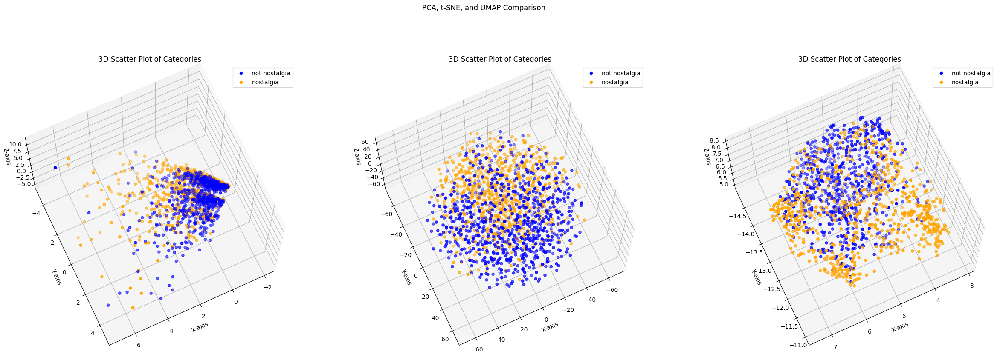

In [89]:
from mpl_toolkits.mplot3d import Axes3D

col = ['blue', 'orange']
categories = X['sentiment'].unique() 

# Define the function to create a 3D scatter plot
def plot_3d_scatter(ax, X_reduced, title, elev = 30, azim = 60):
    for c, category in zip(col, categories):
        # Extract x, y, z coordinates for each category
        mask = X['sentiment'] == category
        xs = X_reduced[mask][:, 0]  # First column for x
        ys = X_reduced[mask][:, 1]  # Second column for y
        zs = X_reduced[mask][:, 2]  # Third column for z

        # Plot each category
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)

    ax.set_title(title)
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')
    ax.legend(loc='upper right')
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.view_init(elev = elev, azim = azim)


# Call the function
angle_list = [10, 45, 70]
azim_list = [20, 45, 65]

for angle in angle_list:
    for azim in azim_list:
        fig = plt.figure(figsize=(30, 10))
        fig.suptitle('PCA, t-SNE, and UMAP Comparison')
        # Add 3D subplot
        # Create 3D subplots
        ax1 = fig.add_subplot(131, projection='3d')  # First subplot
        ax2 = fig.add_subplot(132, projection='3d')  # Second subplot
        ax3 = fig.add_subplot(133, projection='3d')  # Third subplot
        plot_3d_scatter(ax1, X_pca_aug_3d, '3D Scatter Plot of Categories', angle, azim)
        plot_3d_scatter(ax2, X_tsne_aug_3d, '3D Scatter Plot of Categories', angle, azim)
        plot_3d_scatter(ax3, X_umap_aug_3d, '3D Scatter Plot of Categories', angle, azim)
        plt.show()



---

### 3.6 Discretization and Binarization
In this section we are going to discuss a very important pre-preprocessing technique used to transform the data, specifically categorical values, into a format that satisfies certain criteria required by particular algorithms. Given our current original dataset, we would like to transform one of the attributes, `category_name`, into four binary attributes. In other words, we are taking the category name and replacing it with a `n` asymmetric binary attributes. The logic behind this transformation is discussed in detail in the recommended Data Mining text book (please refer to it on page 58). People from the machine learning community also refer to this transformation as one-hot encoding, but as you may become aware later in the course, these concepts are all the same, we just have different prefrence on how we refer to the concepts. Let us take a look at what we want to achieve in code. 

In [166]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.sentiment)
X['bin_category'] = mlb.transform(X['sentiment']).tolist()
X[0:9]

,sentiment,comment,category,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,0,"[He, was, a, singer, with, a, golden, voice, t...","{now,, can, for, with, to, the, at, but,, voic...",[1]
1,nostalgia,The mist beautiful voice ever I listened to hi...,1,"[The, mist, beautiful, voice, ever, I, listene...","{beautiful, forgotten, angel, to, voice, when,...",[0]
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,1,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{Jesus, who, loving, job, 17., voice,, They, g...",[0]
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,0,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{tour, back, who, can, for, hope, Viet, from, ...",[1]
4,nostalgia,listening to his songs reminds me of my mum wh...,1,"[listening, to, his, songs, reminds, me, of, m...","{listening, songs, reminds, who, him, of, mum,...",[0]
5,nostalgia,"Every time I heard this song as a child, I use...",1,"[Every, time, I, heard, this, song, as, a, chi...","{appreciate, heard, souls., to, me, voice, you...",[0]
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...",1,"[My, dad, loved, listening, to, Jim, Reeves, ,...","{70's, back, for, things., to, me, the, then,,...",[0]
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,1,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{with, Jim, to, me, the, comes, he, tunes, Ree...",[0]
8,not nostalgia,Wherever you are you always in my heart,0,"[Wherever, you, are, you, always, in, my, heart]","{you, Wherever, are, heart, my, always, in}",[1]


Take a look at the new attribute we have added to the `X` table. You can see that the new attribute, which is called `bin_category`, contains an array of 0's and 1's. The `1` is basically to indicate the position of the label or category we binarized. If you look at the first two records, the one is places in slot 2 in the array; this helps to indicate to any of the algorithms which we are feeding this data to, that the record belong to that specific category. 

Attributes with **continuous values** also have strategies to tranform the data; this is usually called **Discretization** (please refer to the text book for more inforamation).

---

# 4. Data Exploration

Sometimes you need to take a peek at your data to understand the relationships in your dataset. Here, we will focus in a similarity example. Let's take 3 documents and compare them.

In [173]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = X.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = X.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = X.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

#print select comment
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


Let's look at our emails.

In [172]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for abscence, 1 for prescence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

In [174]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

/var/folders/my/jyv9xh3j5_50z7xs_n2461zr0000gn/T/ipykernel_1873/452772485.py:17: Depreca

As expected, cosine similarity between a sentence and itself is 1. Between 2 entirely different sentences, it will be 0. 

We can assume that we have the more common features in the documents 1 and 3 than in documents 1 and 2. 


---

# 5. Data Classification
Data classification is one of the most critical steps in the final stages of the data mining process. After uncovering patterns, trends, or insights from raw data, classification helps organize and label the data into predefined categories. This step is crucial in making the mined data actionable, as it allows for accurate predictions and decision-making.

Among various classification techniques, the **Naive Bayes classifier** is a simple yet powerful algorithm commonly used for text classification tasks. Specifically, the Bernouli Naive Bayes classifier is particularly suited for datasets where features are represented by term frequencies, such as a document-term matrix, like the one we have.

In [176]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report, accuracy_score


# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, X['sentiment'], test_size=0.3, random_state=42)

In [178]:
# Train the Naive Bayes classifier
#nb_classifier = MultinomialNB()
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8521    0.9399    0.8939       233
    nostalgia     0.9275    0.8249    0.8732       217

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



In [179]:
#Model with the augmented data

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(augmented_df, X['category'], test_size=0.3, random_state=42)

In [181]:
# Train the Naive Bayes classifier
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.9022222222222223

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9179    0.8756    0.8962       217
    nostalgia     0.8889    0.9270    0.9076       233

     accuracy                         0.9022       450
    macro avg     0.9034    0.9013    0.9019       450
 weighted avg     0.9029    0.9022    0.9021       450



As you might have seen from the first model, the document-term matrix data already allows the model to classify it with great accuracy, but if we add the additional information provided by the patterns then we see a slightly better result to an already high score. While the document-term matrix captures individual word frequencies, the pattern matrix adds valuable information about co-occurrences and higher-level word combinations, providing complementary insights. This enhanced feature set allows the classifier to better differentiate between categories, particularly in cases where word frequencies alone might not be enough. 

So, now you know the importance of feature creation and pattern mining, it can give you an edge at the time of data classification.

-----

## Part 2

### Term Frequency-Inverse Document Frequency (TF-IDF)

In this part, we would like to introduce a different Feature subset selection method called TF-IDF :

TF-IDF (Term Frequency-Inverse Document Frequency) is a widely used information retrieval technique that assesses the importance of a word in a document. It consists of two main components:

1. **TF (Term Frequency)**:
   - This calculates the frequency of a term in a document. It is typically expressed as the number of times the term appears in the document divided by the total number of words in the document. TF reflects the significance of the term within that specific document.


2. **IDF (Inverse Document Frequency)**:
   - This measures the general importance of a term across the entire corpus. The less frequently a term appears in the documents of the corpus, the higher its IDF value, indicating its greater significance for distinguishing documents.


### Applications

TF-IDF is commonly used in various fields, including:

- **Text Classification**: Such as spam detection and topic classification.
- **Information Retrieval**: To improve the ranking of search engine results.
- **Text Similarity Calculation**: In document clustering and recommendation systems.

By combining these two metrics, TF-IDF effectively evaluates the importance of a term within a specific document, aiding in text analysis and information retrieval.

Here we would like to import the sklearn package to transform the text data in comment collumn into term score matrix.

In [192]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
X_tfidf = vectorizer.fit_transform(X['comment'])

X_tfidf = X_tfidf.toarray()

X_tfidf[50:55, 1:11]

array([[0.        , 0.        , 0.        , 0.18491115, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ]])

As the slice matrix we present above, we could see that the value of the TF-IDF matrix is no longer the frequency compared to the term frequency matrix we apporach trhough the vectoercounts method.

Here we try to present the top 300 value terms of TF-IDF transfromed data.

In [193]:
term_name_tfidf = vectorizer.get_feature_names_out()
term_frequencies_tfidf = X_tfidf.sum(axis = 0)


sorted_indices = np.argsort(term_frequencies)
sorted_indices
X_tfidf[:,sorted_indices]
term_name_tfidf[sorted_indices]

# plot the first 300 vocab in X_counts
x = term_name_tfidf[sorted_indices][:300]
y = np.sort(term_frequencies_tfidf)[::-1][:300]

# plot interact figure of data
data = {'terms': x, 'value': y}
fig = px.bar(data, x='terms', y='value', title='Top 300 score of tf-idf data')
fig.show()

The plot of Tf-IDF data also shows a long-tail pattern.

Next, we are going to split the original data into two according to the different sentiment status. In order to takes a deeper looks for the distribution behind two status.

In [194]:
#Create separate DataFrames for each category
categories = X['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = X[X['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_tfidf_term_document_df(df):
    count_vect = TfidfVectorizer()  # Initialize the CountVectorizer
    X_counts = count_vect.fit_transform(df['comment'])  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(X_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_tfidf_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_tfidf_term_document_dfs[category] = create_tfidf_term_document_df(category_dfs[category])

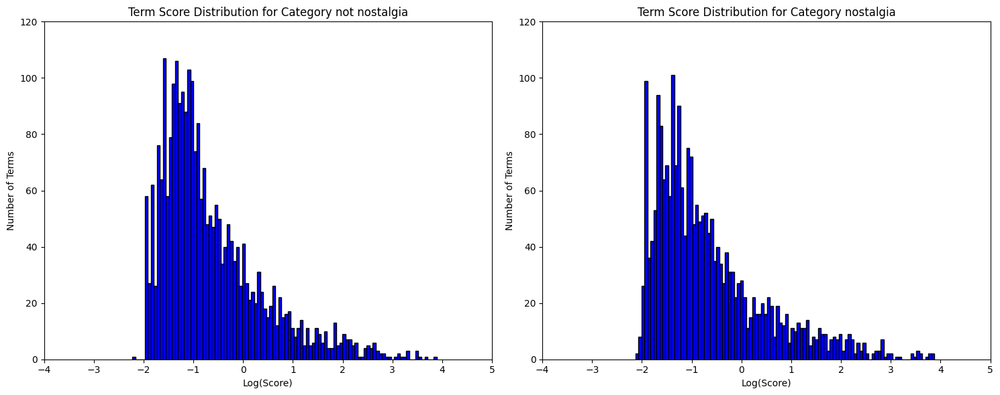

In [200]:
import matplotlib.pyplot as plt
import numpy as np

# Create a 1x2 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

category_number = [0, 1]

# Loop over categories to plot each histogram on a separate subplot
for idx, category_number in enumerate(category_number):
    word_counts = filt_tfidf_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
    
    # Plot histogram on respective axis
    axes[idx].hist(np.log(word_counts), bins=100, color='blue', edgecolor='black')
    axes[idx].set_title(f'Term Score Distribution for Category {categories[category_number]}')
    axes[idx].set_xlabel('Log(Score)')
    axes[idx].set_ylabel('Number of Terms')
    axes[idx].set_ylim(0, 120)
    axes[idx].set_xlim(-4, 5)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


The distribution of two sentiment status does not looks different. However, the distribution looks a little bit skew to the right. The distribution pattern is a little bit far from the bell-shape (Gaussain) which we prefer.

In order to present the intuitive method to show the TF-IDF score of terms, here I approach the wordcloud method to present the highest 20 score terms. 

In [201]:
from collections import Counter
import plotly.graph_objects as go
from plotly.colors import sample_colorscale

# Prepare data for plotting
words = list(term_name_tfidf[sorted_indices][:20])
frequencies = list(np.sort(term_frequencies_tfidf)[::-1][:20])

sizes = [freq * 2 for freq in frequencies]  # Scale font sizes

#Create grid positions with some jitter to avoid overlap
grid_size = int(np.ceil(np.sqrt(len(words))))  # Set up a grid based on word count
x_positions, y_positions = np.meshgrid(range(grid_size), range(grid_size))
x_positions = x_positions.flatten()[:len(words)] + np.random.uniform(-3000, 3000, len(words))
y_positions = y_positions.flatten()[:len(words)] + np.random.uniform(-3000, 3000, len(words))


# Generate random colors for each word
colors = sample_colorscale("Oranges", [ i/len(words) for i in range(len(words))])[::-1]


# Create scatter plot with text
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=x,
    y=y,
    mode='text',
    text=words,
    textfont={'size': sizes, 'color': colors},
    textposition="middle center"
))

# Customize layout for aesthetics
fig.update_layout(
    title="Word Cloud",
    xaxis=dict(showgrid=False, zeroline=False, visible=False),
    yaxis=dict(showgrid=False, zeroline=False, visible=False),
    plot_bgcolor='black',
    width=1000,  # Set the desired width
    height=1000   # Set the desired height
)

fig.show()


### Classification

In this section, we will use the TF-IDF generated matrix to classify the two sentiment status. Since the prediction number of class only has value 0 or 1, we would like to change the classifer modle into the Bernouli probability-based model.

In [202]:
#Model with the augmented data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.naive_bayes import BernoulliNB


# Create a mapping from numerical labels to category names
category_mapping = dict(X[['category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, X['category'], test_size=0.3, random_state=42)

# Train the Naive Bayes classifier
nb_classifier = BernoulliNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.9275    0.8249    0.8732       217
    nostalgia     0.8521    0.9399    0.8939       233

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



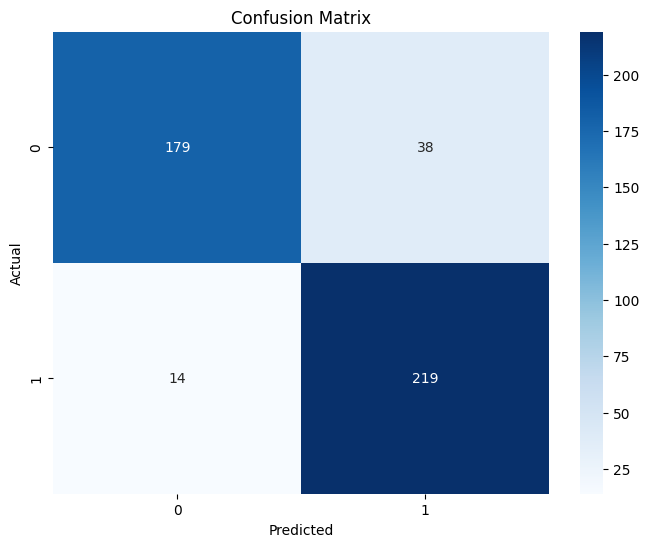

In [203]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            #xticklabels=X.sentiment_names, 
            #yticklabels=X.sentiment_names
            )
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()